# Modelling a planning formula for long distance cycling

In [2]:
%load_ext autotime

time: 502 µs (started: 2021-10-13 17:13:37 -03:00)


In [3]:
import matplotlib.pyplot as plt
from dataclasses import dataclass
import pandas as pd

import statsmodels.api as sm
import pymc3 as pm
import numpy as np
import seaborn as sns

time: 4.2 s (started: 2021-10-13 17:13:37 -03:00)


In [8]:
DATA = """
moving_time	distance_in_km	downhill_in_m	uphill_in_m	tailwind_in_kph	power_estimate
4:34	113.8	472	512	7	108
4:06	100.7	872	912	8	111
3:04	75.3	585	515	3.5	112
4:23	121.7	435	435	6	100
7:52	164.4	1021	1021	5	79
6:18	140.7	701	726	2	82
8:17	171.9	587	657	2	72
5:16	125.1	508	538	-0.5	99
4:27	105.8	806	916	8	100
4:03	103.7	582	702	3	102
3:35	81.5	858	506	9	98
8:04	206.5	2186	2506	9	125
4:54	125.8	1111	971	22	127
1:58	59.5	80	180	11	123
3:32	88.4	1007	1057	7	128
4:45	84.8	570	570	-12	132
5:21	108.1	700	670	5	89
1:50	33.7	322	372	2	78
4:32	64.9	528	420	9	65
5:45	153.7	1189	999	14	131
8:25	169.01	1743	1743	-3.5	92
5:57	123.9	1712	1742	2	125
6:45	154.1	1739	1739	1	114
"""


from io import StringIO

with StringIO(DATA) as fid:
    df = (pd.read_csv(fid, delimiter='\t')
             .assign(moving_time=lambda df: df.moving_time.map(lambda x: x + ":00"))
             .assign(moving_time=lambda df: pd.to_timedelta(df.moving_time).dt.total_seconds() / (60 * 60))
                    )
df

,moving_time,distance_in_km,downhill_in_m,uphill_in_m,tailwind_in_kph,power_estimate
0,4.566667,113.80,472,512,7.0,108
1,4.100000,100.70,872,912,8.0,111
2,3.066667,75.30,585,515,3.5,112
3,4.383333,121.70,435,435,6.0,100
4,7.866667,164.40,1021,1021,5.0,79
5,6.300000,140.70,701,726,2.0,82
6,8.283333,171.90,587,657,2.0,72
7,5.266667,125.10,508,538,-0.5,99
8,4.450000,105.80,806,916,8.0,100
9,4.050000,103.70,582,702,3.0,102


time: 26.9 ms (started: 2021-10-13 17:14:13 -03:00)


In [9]:
@dataclass
class Activity():
    label: str
    distance_in_km: float
    uphill_in_m: float
    downhill_in_m: float
    wind_speed_in_kph: float
    moving_time_in_h: float
    avg_hr_in_bpm: float
    consecutive_days: int
    power: float
        

activities = []
for i, row in df.iterrows():    
    activity = Activity(i, 
                        row.distance_in_km,
                        row.uphill_in_m,
                        row.downhill_in_m,
                        row.tailwind_in_kph,
                        row.moving_time,
                        None,
                        None,
                        row.power_estimate)
    activities.append(activity)
        
df = pd.DataFrame(activities)


df_with_power = df.dropna(subset=['power'])

time: 19.1 ms (started: 2021-10-13 17:14:23 -03:00)


In [10]:
df = df.dropna(axis=1)

time: 6.43 ms (started: 2021-10-13 17:14:27 -03:00)


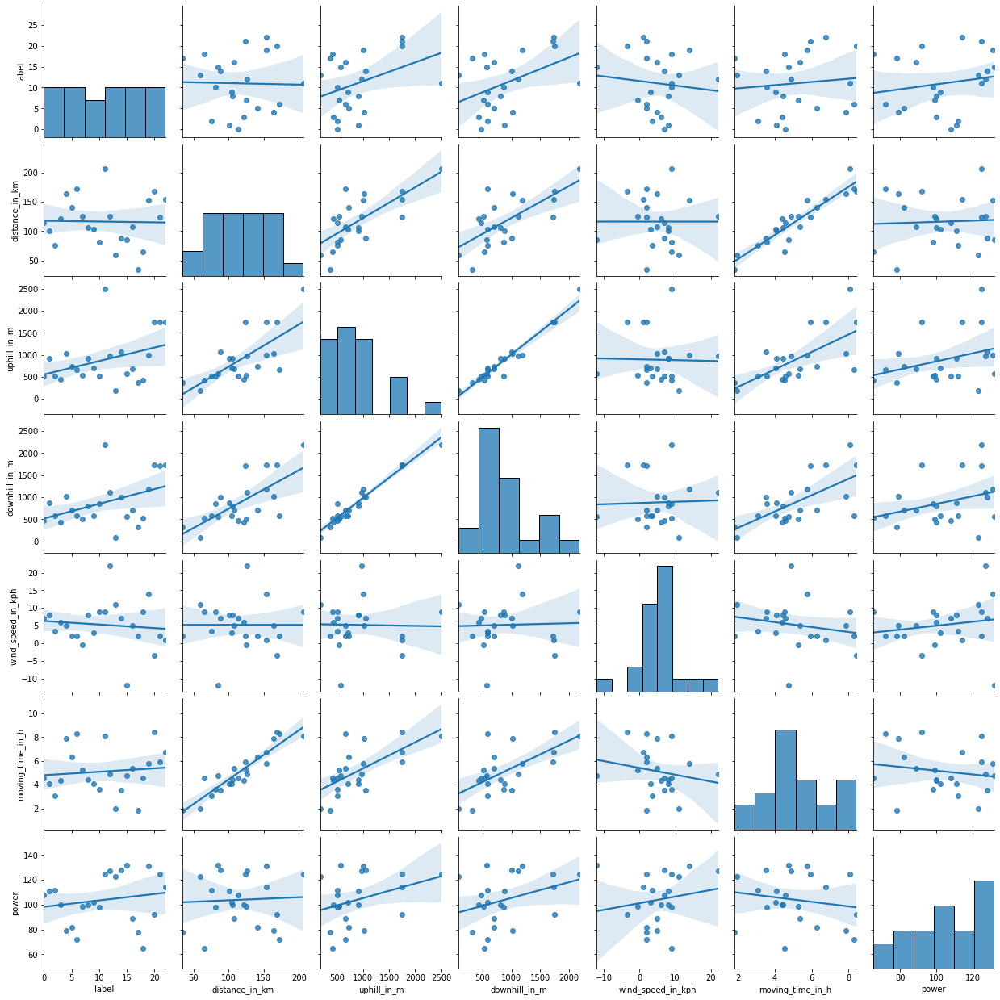

time: 5.59 s (started: 2021-10-13 17:14:28 -03:00)


In [11]:
sns.pairplot(df, kind='reg')
plt.show()

In [13]:
FEATURES = {'distance_in_km',
            'uphill_in_m',
            'downhill_in_m',
            'wind_speed_in_kph',
            'power'}

y = df.moving_time_in_h
X = df.loc[:, FEATURES]

results = sm.GLS(y, X).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 GLS Regression Results                                
=======================================================================================
Dep. Variable:       moving_time_in_h   R-squared (uncentered):                   0.989
Model:                            GLS   Adj. R-squared (uncentered):              0.986
Method:                 Least Squares   F-statistic:                              324.2
Date:                Wed, 13 Oct 2021   Prob (F-statistic):                    5.65e-17
Time:                        17:14:45   Log-Likelihood:                         -19.677
No. Observations:                  23   AIC:                                      49.35
Df Residuals:                      18   BIC:                                      55.03
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
distance_in_km        0.0465      0.004     11.796      0.000       0.038       0.055
power                -0.0013      0.004     -0.343      0.736      -0.009       0.006
downhill_in_m         0.0020      0.001      1.694      0.107      -0.000       0.005
wind_speed_in_kph    -0.0580      0.022     -2.620      0.017      -0.105      -0.012
uphill_in_m          -0.0019      0.001     -1.691      0.108      -0.004       0.000
==============================================================================
Omnibus:                       10.148   Durbin-Watson:                   2.243
Prob(Omnibus):                  0.006   Jarque-Bera (JB):                8.918
Skew:                           1.011   Prob(JB):                       0.0116
Kurtosis:                       5.284   Cond. No.                         242.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

time: 31.2 ms (started: 2021-10-13 17:14:45 -03:00)


## Bayesian Modelling

In [14]:
def summarize_trace(trace):
    print("-- median --")
    print(trace.posterior.median())
    print("-- std --")
    print(trace.posterior.std())
    print("-- std per median -- ")
    print(trace.posterior.std() / trace.posterior.median())
    pm.plot_trace(trace)
    plt.show()

    bfmi = np.max(pm.stats.bfmi(trace))
    max_gr = max(np.max(gr_stats) for gr_stats in pm.stats.rhat(trace).values()).values
    (
        pm.plot_energy(trace, legend=False, figsize=(6, 4)).set_title(
            f"BFMI = {bfmi :.2e}\nGelman-Rubin = {max_gr :.2e}"
        )
    )
    plt.show()

    pm.plot_posterior(trace)
    plt.show()
    
    pd.plotting.scatter_matrix(trace.posterior.to_dataframe(), figsize=(20, 20))
    plt.show()

time: 2.06 ms (started: 2021-10-13 17:14:54 -03:00)


### Model 1

$$\hat{t} = \frac{x + \alpha u + \beta d}{v_f + \gamma w}$$

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, gamma, v_f, beta, alpha]


Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 28 seconds.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


-- median --
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 -0.008535
    alpha    float64 0.01963
    v_f      float64 23.71
    gamma    float64 0.3596
    sigma    float64 0.7195
-- std --
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 0.00505
    alpha    float64 0.005443
    v_f      float64 1.306
    gamma    float64 1.081
    sigma    float64 1.424
-- std per median -- 
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 -0.5917
    alpha    float64 0.2773
    v_f      float64 0.05509
    gamma    float64 3.006
    sigma    float64 1.979


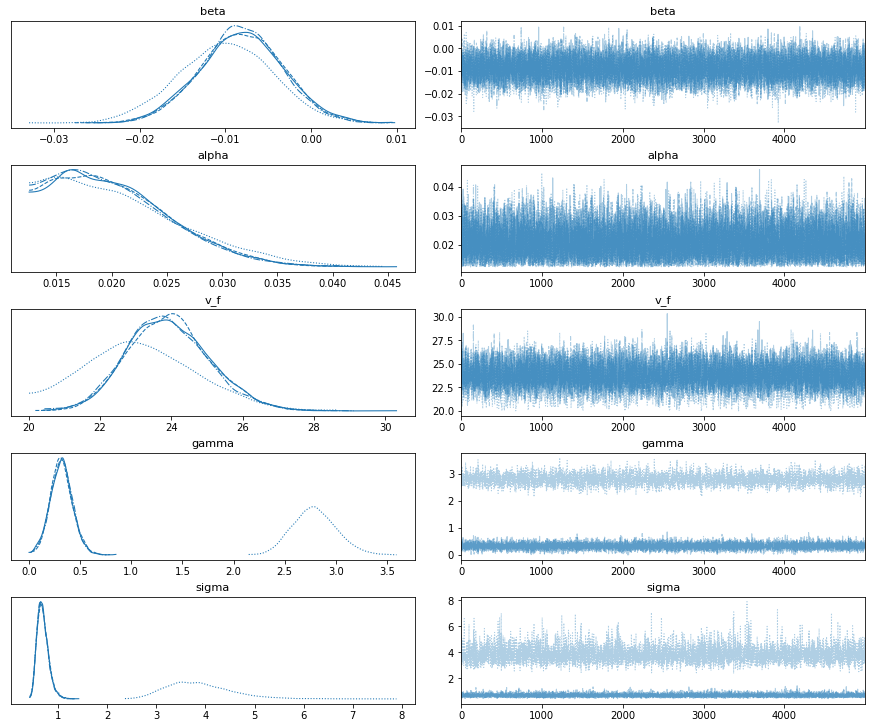

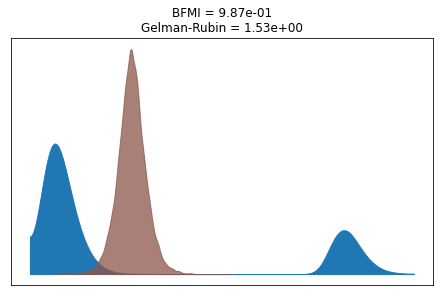

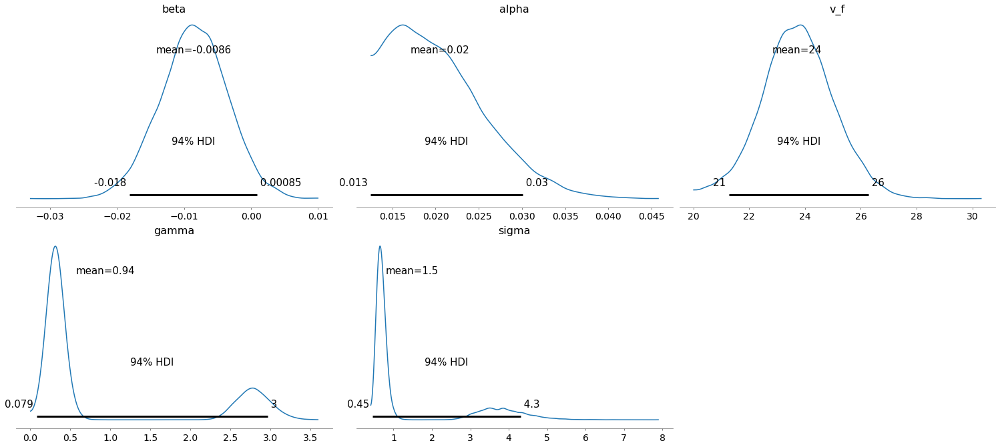

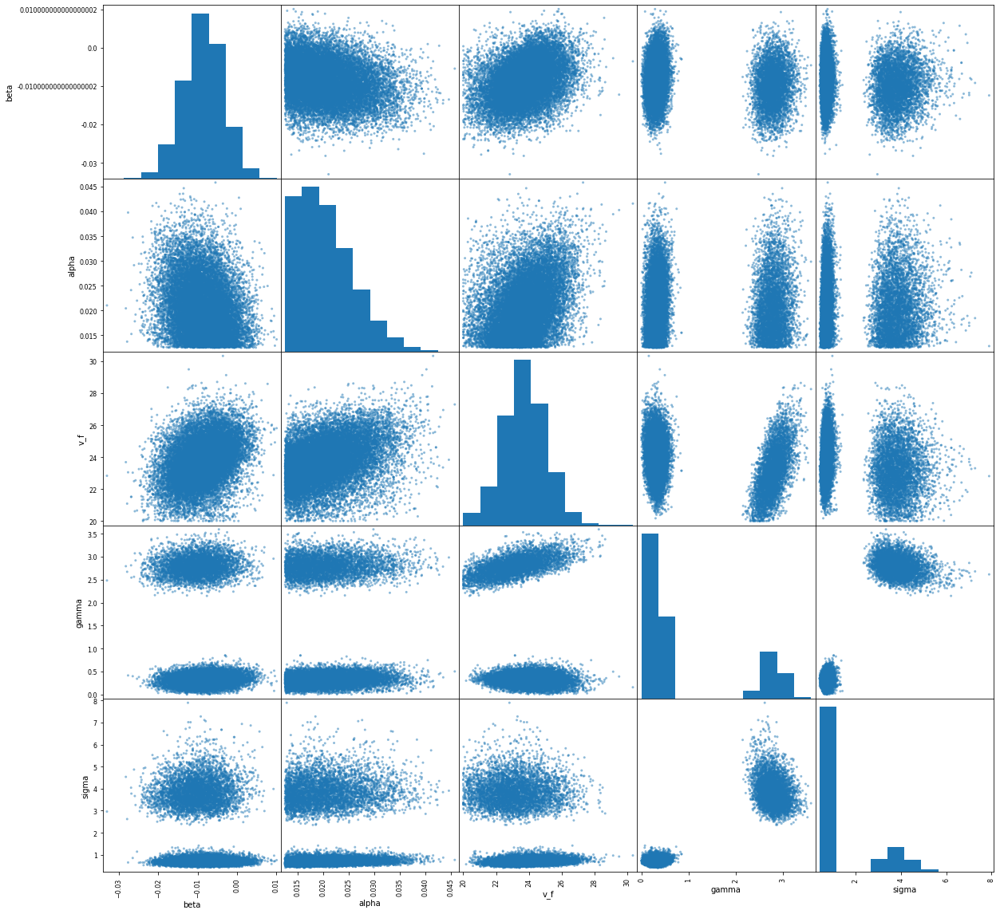

time: 43.2 s (started: 2021-10-13 17:14:55 -03:00)


In [15]:
with pm.Model() as model:
    alpha = pm.TruncatedNormal('alpha', mu=1/50, 
                                        sigma=1/100,
                                        lower=1/80,
                                        upper=1/20)
    beta = pm.Normal('beta', 
                     mu=-1/120, 
                     sigma=1/180)
    
    v_f = pm.TruncatedNormal('v_f', 
                             mu=25.5,
                             sigma=2,
                             lower=20,
                             upper=32)
    
    gamma = pm.TruncatedNormal('gamma', 
                               mu=2/3, 
                               sigma=1/2, 
                               lower=0.0)
    
    model = (alpha * df.uphill_in_m + beta * df.downhill_in_m)
    model += df.distance_in_km
    model /= (v_f + gamma * df.wind_speed_in_kph)
    
    sigma = pm.HalfCauchy('sigma', beta=10, testval=1)
    
    y = df.moving_time_in_h
    
    likelihood = pm.Normal('t', mu=model, sigma=sigma, observed=y)
    trace = pm.sample(5_000, 
                      tune=1_000,
                      target_accept=0.95,
                      return_inferencedata=True)
    
summarize_trace(trace)

### Model 1b

$$\hat{t} = \frac{x}{v_f + \gamma w} + \frac{\alpha u + \beta d}{v_f}$$

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, gamma, v_f, beta, alpha]


Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 27 seconds.


-- median --
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 -0.007984
    alpha    float64 0.01929
    v_f      float64 23.89
    gamma    float64 0.3395
    sigma    float64 0.6773
-- std --
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 0.004793
    alpha    float64 0.00521
    v_f      float64 1.172
    gamma    float64 0.1264
    sigma    float64 0.1196
-- std per median -- 
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 -0.6003
    alpha    float64 0.2701
    v_f      float64 0.04908
    gamma    float64 0.3723
    sigma    float64 0.1766


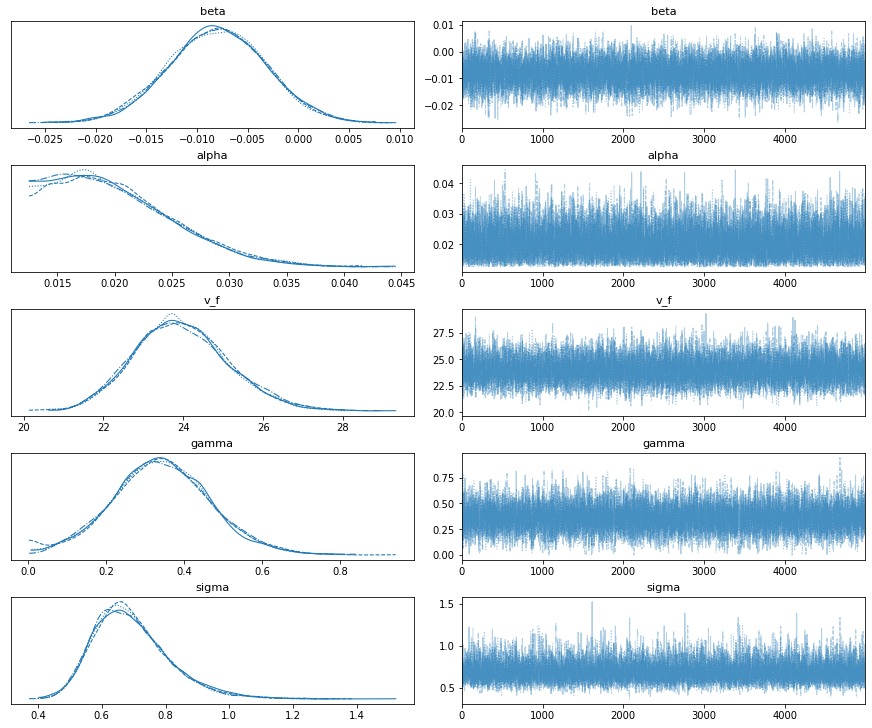

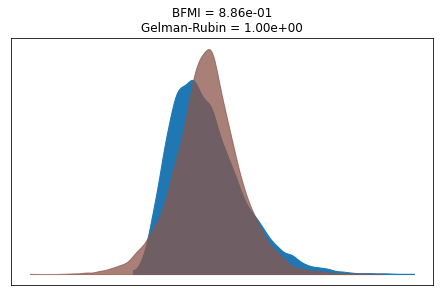

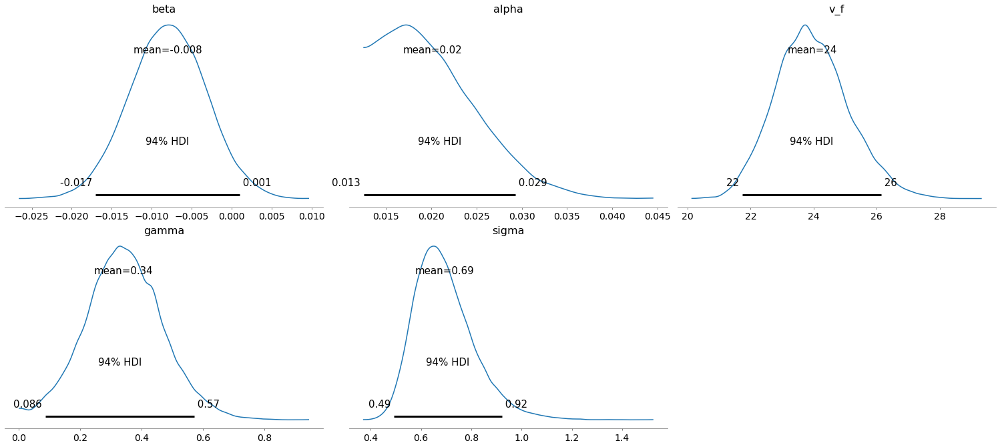

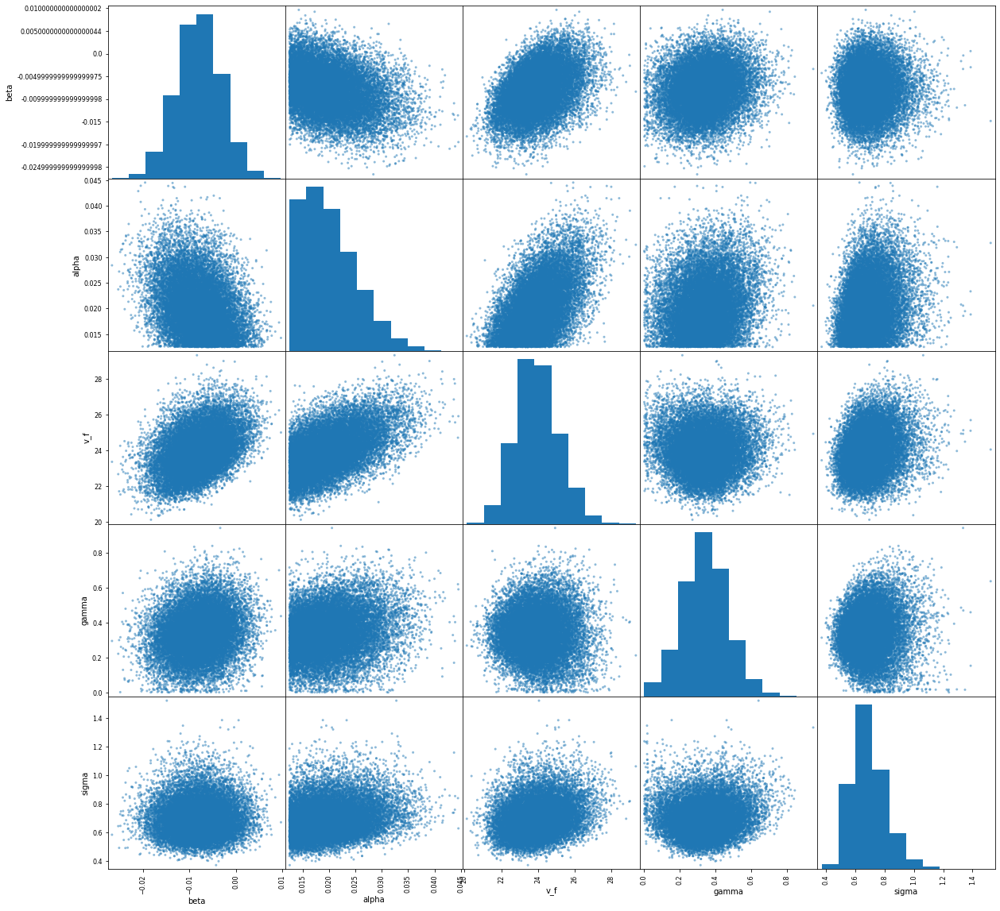

time: 38 s (started: 2021-10-13 17:15:38 -03:00)


In [16]:
with pm.Model() as model:
    alpha = pm.TruncatedNormal('alpha', mu=1/50, 
                                        sigma=1/100,
                                        lower=1/80,
                                        upper=1/20)
    beta = pm.Normal('beta', 
                     mu=-1/120, 
                     sigma=1/180)
    
    v_f = pm.TruncatedNormal('v_f', 
                             mu=25.5,
                             sigma=2,
                             lower=20,
                             upper=32)
    
    gamma = pm.TruncatedNormal('gamma', 
                               mu=2/3, 
                               sigma=1/2, 
                               lower=0.0)
    
    term_1 = 1 / (v_f + gamma * df.wind_speed_in_kph)
    term_1 *= df.distance_in_km

    term_2 = (alpha * df.uphill_in_m + beta * df.downhill_in_m)
    term_2 /= v_f
    
    model = term_1 + term_2
    
    sigma = pm.HalfCauchy('sigma', beta=10, testval=1)
    
    y = df.moving_time_in_h
    
    likelihood = pm.Normal('t', mu=model, sigma=sigma, observed=y)
    trace = pm.sample(5_000, 
                      tune=1_000,
                      target_accept=0.95,
                      return_inferencedata=True)
    
summarize_trace(trace)

### Model 2

$$\hat{t} = \frac{x + \alpha u (1 - \epsilon) + \beta d \epsilon^2}{v_f + \gamma w}$$

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, epsilon, gamma, v_f, beta, alpha]


Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 27 seconds.


-- median --
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 -0.007012
    alpha    float64 0.02198
    v_f      float64 23.18
    gamma    float64 0.3036
    epsilon  float64 0.5525
    sigma    float64 0.6418
-- std --
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 0.00554
    alpha    float64 0.006953
    v_f      float64 1.116
    gamma    float64 0.1024
    epsilon  float64 0.1982
    sigma    float64 0.1135
-- std per median -- 
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 -0.7901
    alpha    float64 0.3163
    v_f      float64 0.04815
    gamma    float64 0.3372
    epsilon  float64 0.3587
    sigma    float64 0.1769


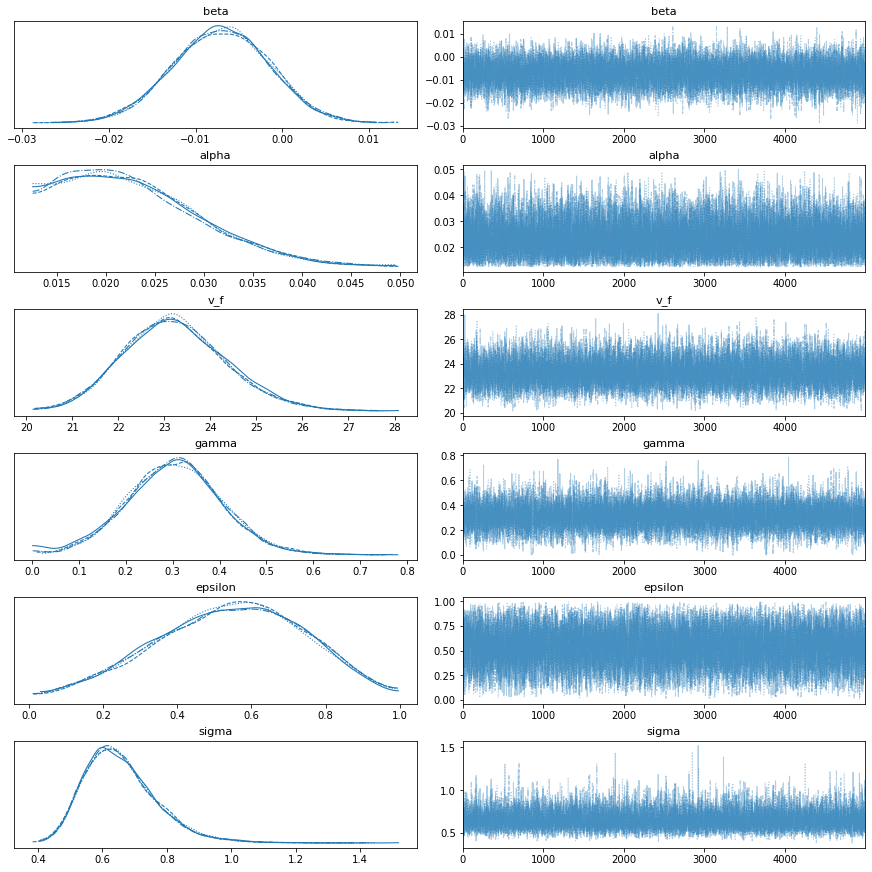

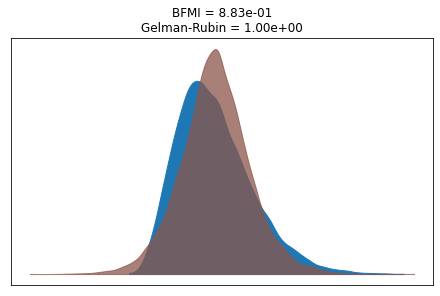

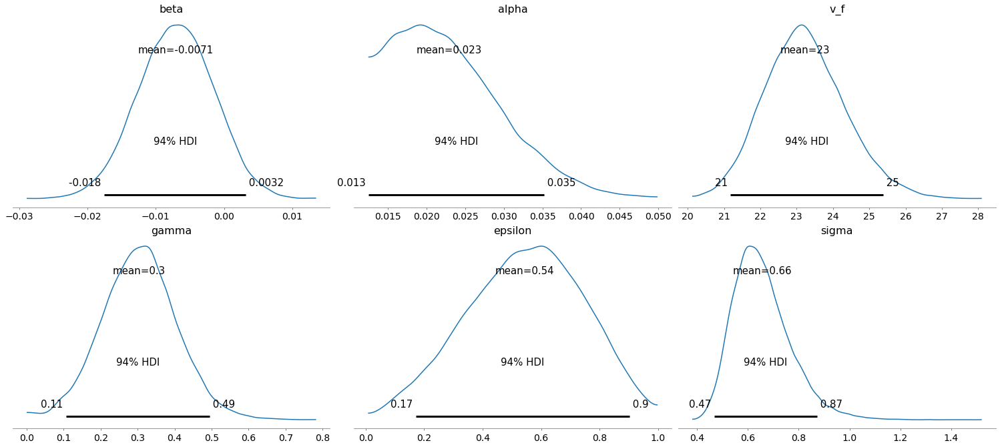

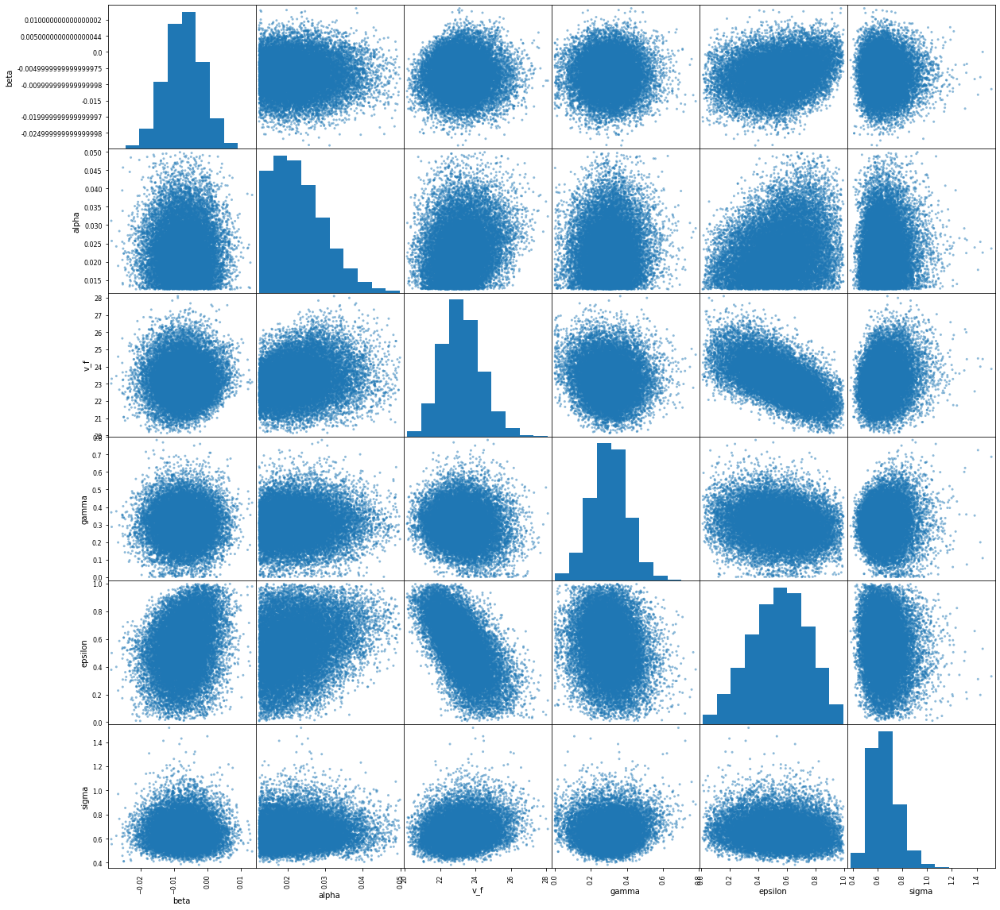

time: 40.9 s (started: 2021-10-13 17:16:16 -03:00)


In [17]:
import pymc3 as pm

with pm.Model() as model:
    alpha = pm.TruncatedNormal('alpha', mu=1/50, 
                                        sigma=1/100,
                                        lower=1/80,
                                        upper=1/20)
    beta = pm.Normal('beta', 
                     mu=-1/120, 
                     sigma=1/180)
    
    v_f = pm.TruncatedNormal('v_f', 
                             mu=25.5,
                             sigma=2,
                             lower=20,
                             upper=32)
    
    gamma = pm.TruncatedNormal('gamma', 
                               mu=2/3, 
                               sigma=1/2, 
                               lower=0.0)
    
    epsilon = pm.Beta('epsilon', 2, 1.5)
    
    model = alpha * df.uphill_in_m * (1 - epsilon)
    model += beta * df.downhill_in_m * (epsilon ** 2)
    model += df.distance_in_km
    model /= (v_f + gamma * df.wind_speed_in_kph)
    
    sigma = pm.HalfCauchy('sigma', beta=10, testval=1)
    
    y = df.moving_time_in_h
    
    likelihood = pm.Normal('t', mu=model, sigma=sigma, observed=y)
    trace = pm.sample(5_000, 
                      tune=1_000,
                      target_accept=0.95,
                      return_inferencedata=True)

summarize_trace(trace)

### Model 5

$$\hat{t} = \frac{x + \alpha u+ \beta d}{v_f}$$

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, v_f, beta, alpha]


Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 24 seconds.


-- median --
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 -0.00922
    alpha    float64 0.01906
    v_f      float64 24.93
    sigma    float64 0.7785
-- std --
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 0.00492
    alpha    float64 0.005105
    v_f      float64 1.216
    sigma    float64 0.1321
-- std per median -- 
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 -0.5336
    alpha    float64 0.2678
    v_f      float64 0.04878
    sigma    float64 0.1697


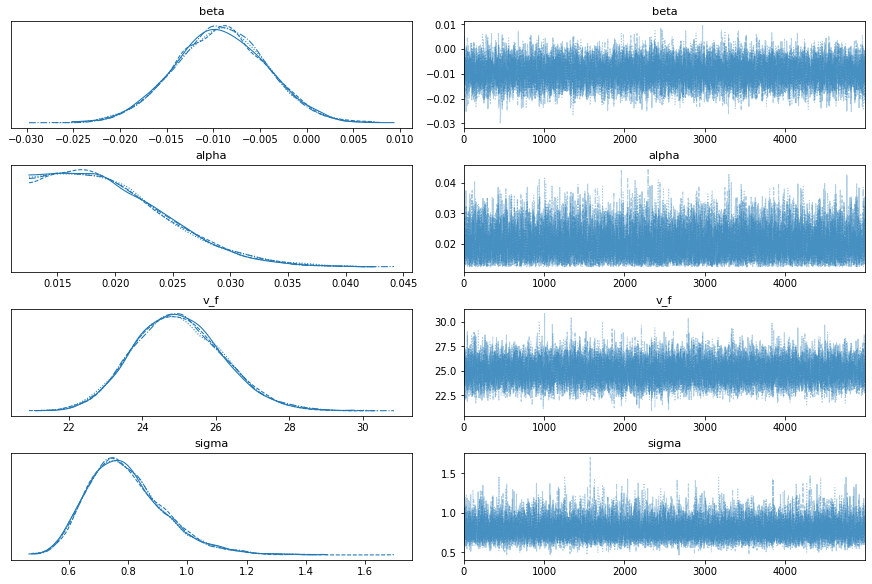

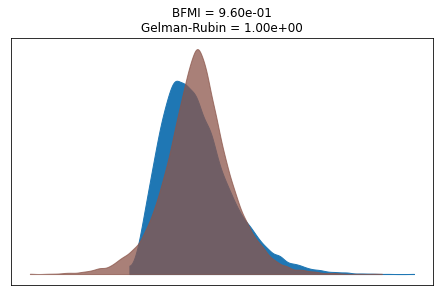

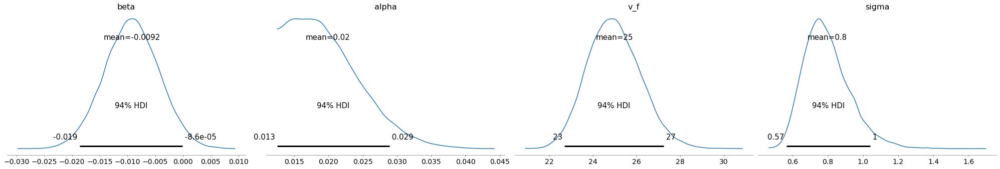

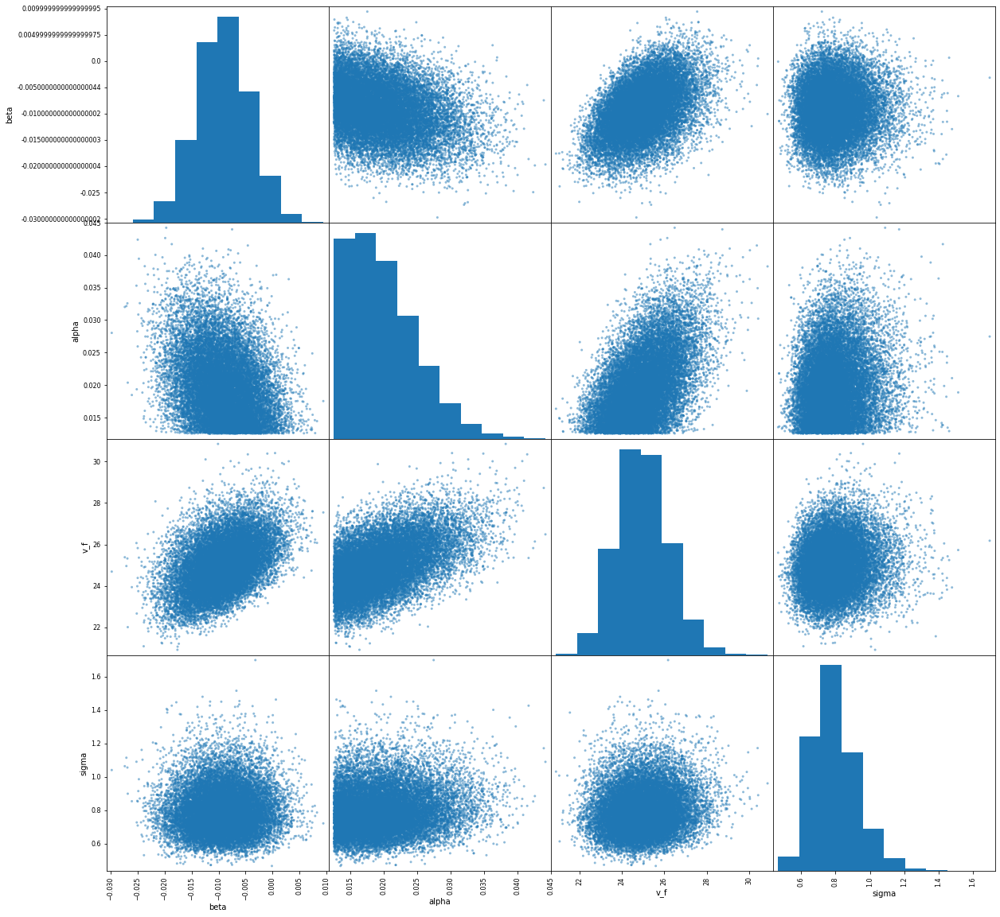

time: 32.1 s (started: 2021-10-13 17:16:57 -03:00)


In [18]:
import pymc3 as pm

with pm.Model() as model:
    alpha = pm.TruncatedNormal('alpha', mu=1/50, 
                                        sigma=1/100,
                                        lower=1/80,
                                        upper=1/20)
    beta = pm.Normal('beta', 
                     mu=-1/120, 
                     sigma=1/180)
    
    v_f = pm.TruncatedNormal('v_f', 
                             mu=25.5,
                             sigma=2,
                             lower=20,
                             upper=32)
    
    model = (alpha * df.uphill_in_m + beta * df.downhill_in_m)
    model += df.distance_in_km
    model /= v_f
    
    sigma = pm.HalfCauchy('sigma', beta=10, testval=1)
    
    y = df.moving_time_in_h
    
    likelihood = pm.Normal('t', mu=model, sigma=sigma, observed=y)
    trace = pm.sample(5_000, 
                      tune=1_000,
                      target_accept=0.95,
                      return_inferencedata=True)
    
summarize_trace(trace)

### Model 6

$$\hat{t} = \delta x + \alpha u + \beta d + \gamma w$$



Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, gamma, beta, alpha, delta]


Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 35 seconds.


-- median --
<xarray.Dataset>
Dimensions:  ()
Data variables:
    delta    float64 0.04376
    alpha    float64 0.0006926
    beta     float64 -0.0005807
    gamma    float64 -0.02379
    sigma    float64 0.7411
-- std --
<xarray.Dataset>
Dimensions:  ()
Data variables:
    delta    float64 0.003603
    alpha    float64 0.0008515
    beta     float64 0.0009392
    gamma    float64 0.02173
    sigma    float64 0.144
-- std per median -- 
<xarray.Dataset>
Dimensions:  ()
Data variables:
    delta    float64 0.08233
    alpha    float64 1.229
    beta     float64 -1.618
    gamma    float64 -0.9134
    sigma    float64 0.1944


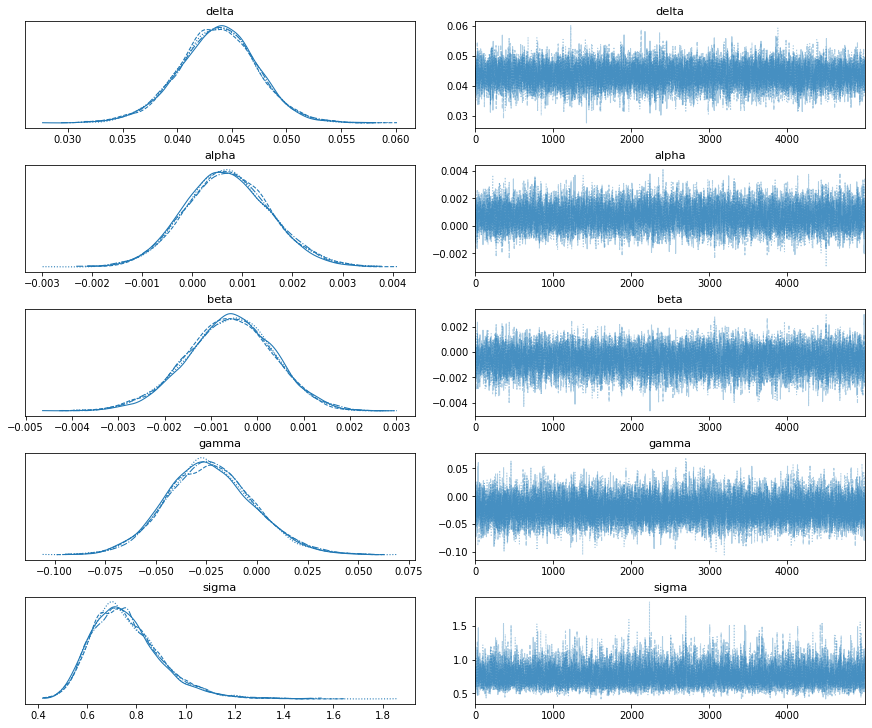

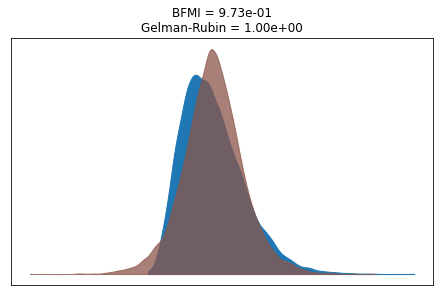

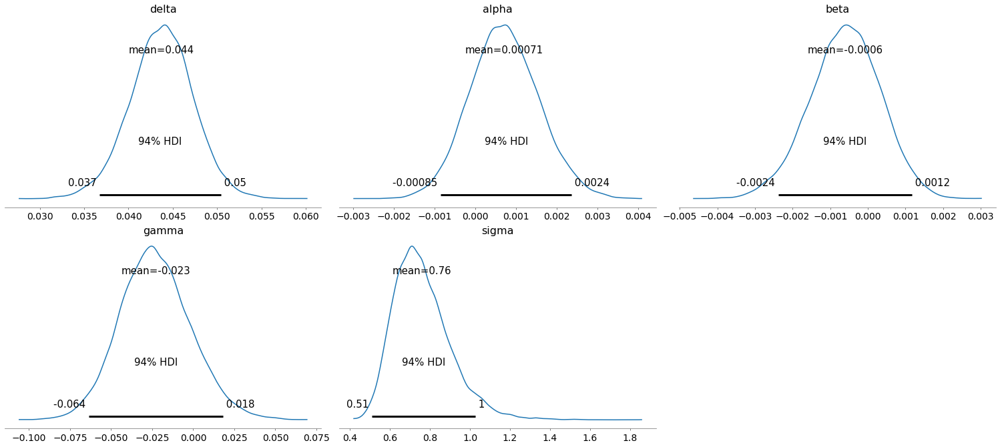

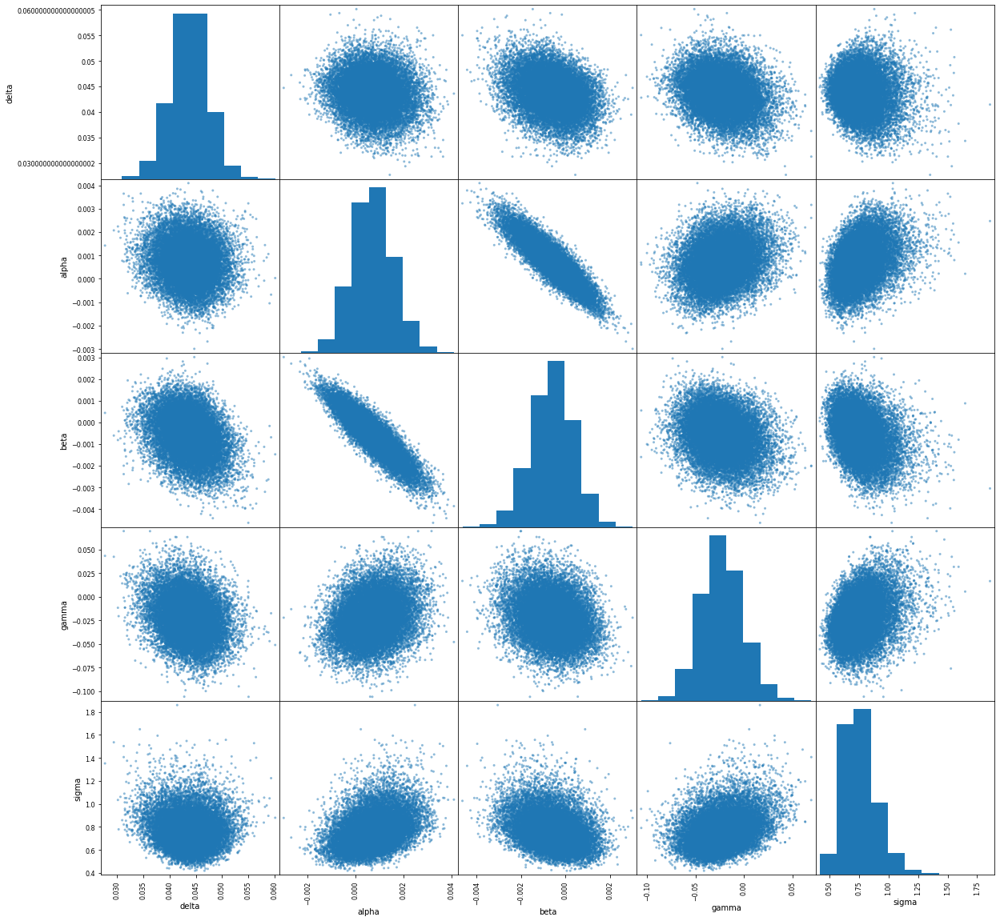

time: 41.7 s (started: 2021-10-13 17:17:29 -03:00)


In [19]:
import pymc3 as pm

with pm.Model() as model:
    
    delta = pm.Normal('delta', 
                               mu=1/25, 
                               sigma=1/50
                              )
    
    alpha = pm.Normal('alpha',
                               mu=1/500,
                               sigma=1/1000,
                           #    lower=0.0,
                           #    upper=1
                              )
    
    beta = pm.Normal('beta',
                               mu=-1/1000,
                               sigma=1/10,
                           #    upper=0.0
                             )
    
    gamma = pm.Normal('gamma',
                               mu=1/25,
                               sigma=1/25,
                             #  lower=0.0,
                             #  upper=1/10
                              )
    
    model = (alpha * df.uphill_in_m + beta * df.downhill_in_m)
    model += delta * df.distance_in_km + gamma * df.wind_speed_in_kph
    
    sigma = pm.HalfCauchy('sigma', beta=5, testval=1)
    
    y = df.moving_time_in_h
    
    likelihood = pm.Normal('t', mu=model, sigma=sigma, observed=y)
    trace = pm.sample(5_000, 
                      tune=1_000,
                      target_accept=0.95,
                      return_inferencedata=True)

summarize_trace(trace)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, psi, gamma, v_f, beta, alpha]


Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 36 seconds.


-- median --
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 -0.004437
    alpha    float64 0.02357
    v_f      float64 25.51
    gamma    float64 0.2115
    psi      float64 0.09889
    sigma    float64 0.4957
-- std --
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 0.004992
    alpha    float64 0.006474
    v_f      float64 0.974
    gamma    float64 0.09849
    psi      float64 0.006183
    sigma    float64 0.08721
-- std per median -- 
<xarray.Dataset>
Dimensions:  ()
Data variables:
    beta     float64 -1.125
    alpha    float64 0.2746
    v_f      float64 0.03817
    gamma    float64 0.4656
    psi      float64 0.06252
    sigma    float64 0.1759


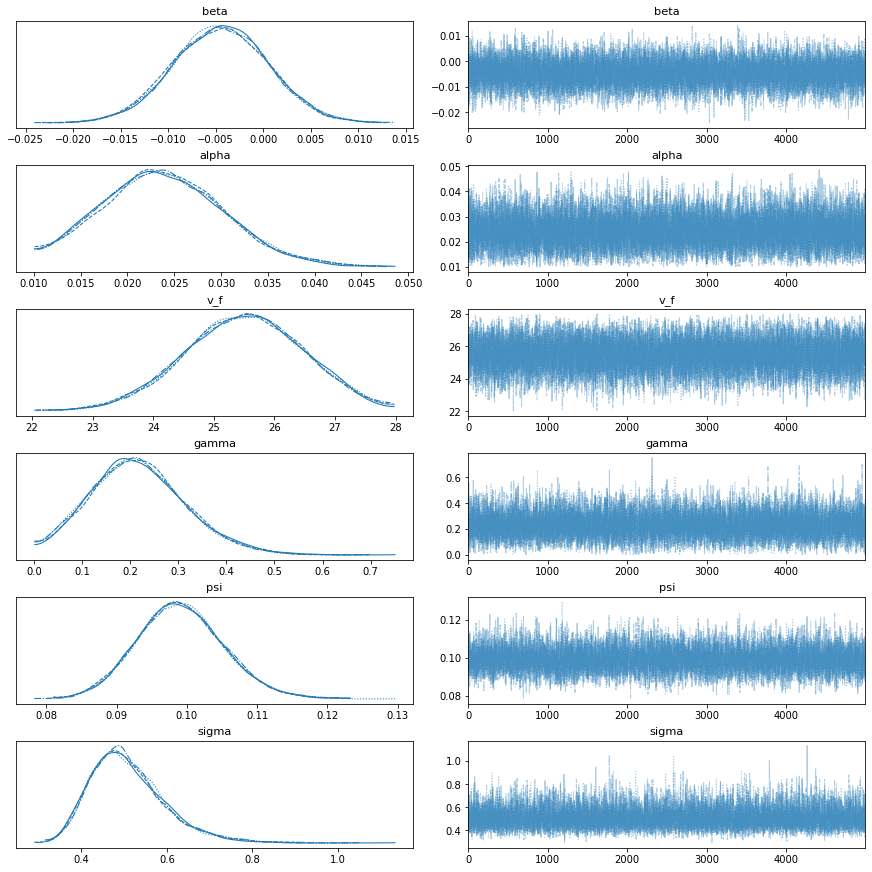

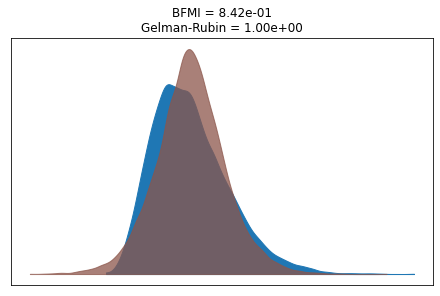

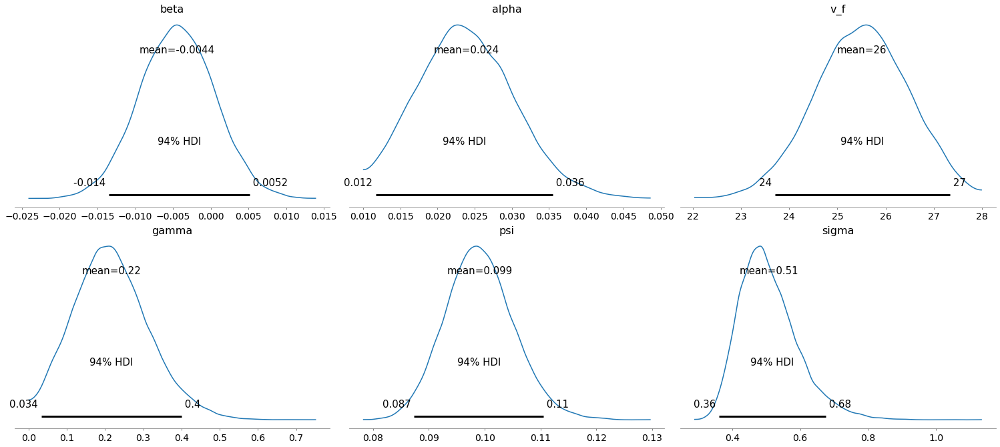

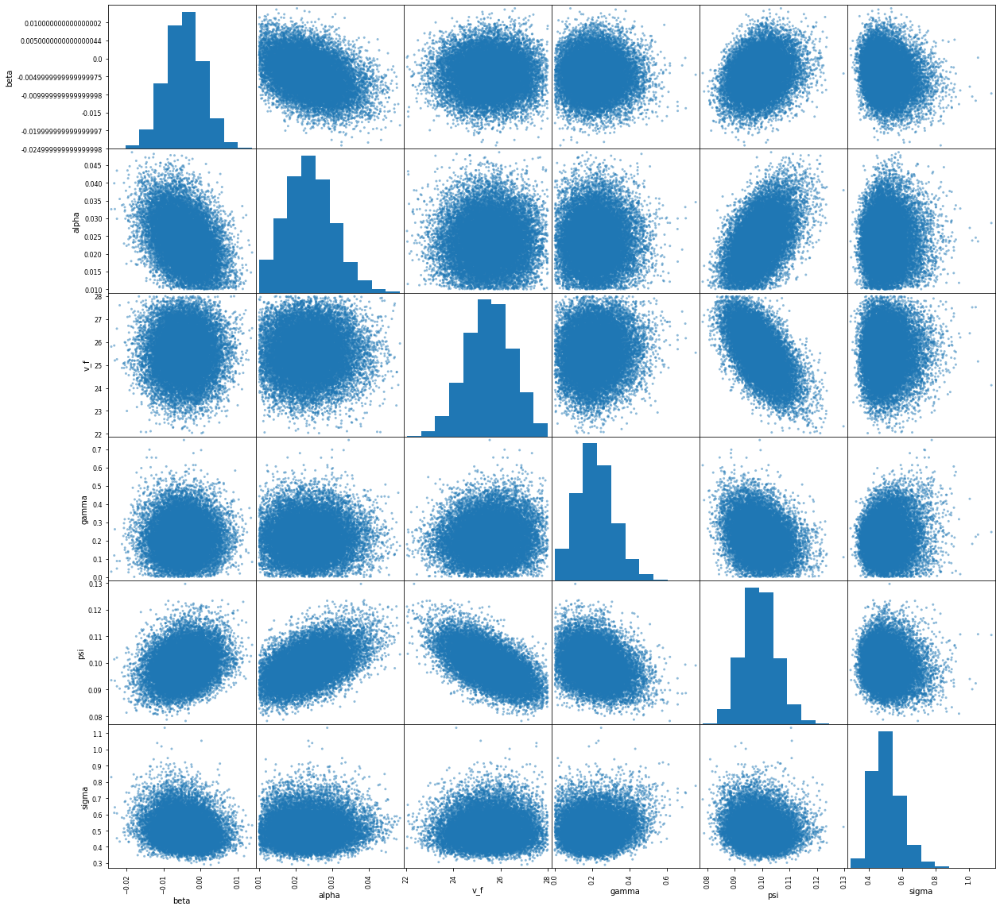

time: 1min 1s (started: 2021-10-13 17:18:11 -03:00)


In [20]:
_df = df
df = df_with_power

with pm.Model() as model:
    alpha = pm.TruncatedNormal('alpha', mu=1/50, 
                                        sigma=1/100,
                                        lower=1/100,
                                        upper=1/20)
    beta = pm.Normal('beta', 
                     mu=-1/120, 
                     sigma=1/180)
    
    v_f = pm.TruncatedNormal('v_f', 
                             mu=25.5,
                             sigma=1,
                             lower=22,
                             upper=28)
    
    gamma = pm.TruncatedNormal('gamma', 
                               mu=2/3, 
                               sigma=1/2, 
                               lower=0.0)
    
    
    P = df.power
    
    psi_0 = pm.TruncatedNormal('psi',
                               mu=1/11,
                               sigma=1/11,
                               lower=0.0,
                               upper=1/2)
    
    model = (alpha * df.uphill_in_m + beta * df.downhill_in_m)
    model += df.distance_in_km
    model /= (v_f + gamma * df.wind_speed_in_kph) * psi_0 * P ** (1 / 2)
    
    sigma = pm.HalfCauchy('sigma', beta=10, testval=1)
    
    y = df.moving_time_in_h
    
    likelihood = pm.Normal('t', mu=model, sigma=sigma, observed=y)
    trace = pm.sample(5_000, 
                      tune=1_000,
                      target_accept=0.95,
                      return_inferencedata=True)
    
summarize_trace(trace)

df = _df